In [1]:
include("../functions.jl")
include("../plotting_functions.jl")
using LaTeXStrings
using JLD
using DataStructures
include("../square-lattice/sq_functions.jl")
include("./az_functions.jl")
import Random
using Statistics


In [2]:
# Generate the aztec diamond lattice and the spin lattice
N = 52 # For the figure in the paper
if N%2 != 0
    println("ERROR: N must be even")
end
# Order of the aztec diamond = N-2. This is for compatision with the literature definition of aztec diamond.
println("Total number of dimer coverings = ", 2^((N-1)*(N-2) ÷ 2)   )
@time az_lat_full = generate_aztec(N)
@time az_lat_spin_full, spin_to_G = generate_spin_lat(az_lat_full, N)


Total number of dimer coverings = 0
  1.406610 seconds (89.00 k allocations: 633.509 MiB, 7.62% gc time)
  2.565974 seconds (138.41 k allocations: 1.173 GiB, 2.77% gc time)


(Graph(ComplexF64[-49.5 + 0.0im, -49.0 - 0.5im, -49.0 + 0.5im, -48.5 - 1.0im, -48.0 - 1.5im, -48.5 + 0.0im, -48.0 - 0.5im, -48.5 + 1.0im, -48.0 + 0.5im, -48.0 + 1.5im  …  47.5 + 1.0im, 48.0 + 0.5im, 47.5 + 2.0im, 48.0 + 1.5im, 48.5 - 1.0im, 48.5 + 0.0im, 49.0 - 0.5im, 48.5 + 1.0im, 49.0 + 0.5im, 49.5 + 0.0im], [0 1 … 0 0; 1 0 … 0 0; … ; 0 0 … 0 1; 0 0 … 1 0], [[2, 3], [1, 4, 6], [1, 6, 8], [2, 5, 7], [4, 11, 13], [2, 3, 7, 9], [4, 6, 13, 15], [3, 9, 10], [6, 8, 15, 17], [8, 17, 19]  …  [9981, 9983, 9992, 9994], [9989, 9991, 9996, 9998], [9983, 9985, 9994], [9991, 9993, 9998], [9988, 9990, 9997], [9990, 9992, 9997, 9999], [9995, 9996, 10000], [9992, 9994, 9999], [9996, 9998, 10000], [9997, 9999]], 10000, [6 13 … 9998 10000; 3 7 … 9994 9999; 1 4 … 9991 9996; 2 5 … 9992 9997], [0;;], [[1, 2], [1, 3], [2, 4], [2, 6], [3, 6], [3, 8], [4, 5], [4, 7], [5, 11], [5, 13]  …  [9992, 9996], [9992, 9998], [9993, 9994], [9994, 9998], [9995, 9997], [9996, 9997], [9996, 9999], [9997, 10000], [9998, 99

In [7]:
# Create the aztec diamond lattice and the spin lattice
az_lat = Graph(az_lat_full.pts, fill(0,1,1), Vector{Vector{Int64}}[], az_lat_full.n, az_lat_full.sq_plaq, fill(0,1,1),Vector{Vector{Int64}}[] )
az_lat_spin = Graph(az_lat_spin_full.pts, fill(0,1,1), Vector{Vector{Int64}}[], az_lat_spin_full.n, az_lat_spin_full.sq_plaq, fill(0,1,1),Vector{Vector{Int64}}[] )
config_hori = generate_config_hori(az_lat_full, az_lat_spin_full, spin_to_G)
config_vert = generate_config_vert(az_lat_full, az_lat_spin_full, spin_to_G)
# @time rand_config = az_randomize_config(1000_000, config_hori, az_lat_spin.sq_plaq)
;


In [8]:
function bipartite_sublattices(adj::AbstractMatrix{Bool})
    n = size(adj, 1)
    color = fill(-1, n)  # -1: unvisited, 0: set A, 1: set B

    for start in 1:n
        if color[start] == -1
            queue = [start]
            color[start] = 0

            while !isempty(queue)
                u = popfirst!(queue)
                for v in 1:n
                    if adj[u, v]
                        if color[v] == -1
                            color[v] = 1 - color[u]
                            push!(queue, v)
                        elseif color[v] == color[u]
                            error("Graph is not bipartite")
                        end
                    end
                end
            end
        end
    end

    set_A = findall(x -> x == 0, color)
    set_B = findall(x -> x == 1, color)
    return set_A, set_B
end

bipartite_sublattices (generic function with 1 method)

In [9]:
A, B = bipartite_sublattices(Matrix{Bool}(az_lat_full.adj))
println("Set A: ", A)
println("Set B: ", B)
sublattice = fill("", length(az_lat.pts))
for a in A
    sublattice[a] = "A"
end
for b in B
    sublattice[b] = "B"
end
if "" in sublattice
    error("Not all sites are assigned to a sublattice")
end

Set A: [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67, 69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99, 101, 103, 105, 107, 109, 111, 113, 115, 117, 119, 121, 123, 125, 127, 129, 131, 133, 135, 137, 139, 141, 143, 145, 147, 149, 151, 153, 155, 157, 159, 161, 163, 165, 167, 169, 171, 173, 175, 177, 179, 181, 183, 185, 187, 189, 191, 193, 195, 197, 199, 201, 203, 205, 207, 209, 211, 213, 215, 217, 219, 221, 223, 225, 227, 229, 231, 233, 235, 237, 239, 241, 243, 245, 247, 249, 251, 253, 255, 257, 259, 261, 263, 265, 267, 269, 271, 273, 275, 277, 279, 281, 283, 285, 287, 289, 291, 293, 295, 297, 299, 301, 303, 305, 307, 309, 311, 313, 315, 317, 319, 321, 323, 325, 327, 329, 331, 333, 335, 337, 339, 341, 343, 345, 347, 349, 351, 353, 355, 357, 359, 361, 363, 365, 367, 369, 371, 373, 375, 377, 379, 381, 383, 385, 387, 389, 391, 393, 395, 397, 399, 401, 403, 405, 407, 409, 411, 413, 415, 417, 41

In [10]:
function plot_config(p, config,spin_to_G, so_lat, A, B, sublattice)
    cols = ["red", "blue", "green", "orange", "black"]
    cols = ["red", "blue", "green", "orange", "black"]
    for i in 1:length(config)
        if config[i] == true
            ind1, ind2 = spin_to_G[i]
            p1, p2 = so_lat.pts[ind1], so_lat.pts[ind2] 
            if sublattice[ind1] == "A" && sublattice[ind2] == "B" 
                indA, indB = ind2, ind1
            elseif sublattice[ind1] == "B" && sublattice[ind2] == "A"
                indA, indB = ind1, ind2
            else
                error("Error: not a bipartite graph")
            end
            color = cols[5]
            pA, pB = so_lat.pts[indA], so_lat.pts[indB]
            if abs( real(pA - pB) ) < 1e-5
                # vertical
                if imag(pA) < imag(pB)
                    color = cols[1]
                else
                    color = cols[3]
                end
            end
            if abs( imag(pA - pB) ) < 1e-5
                # horizontal
                if real(pA) < real(pB)
                    color = cols[2]
                else
                    color = cols[4]
                end
            end
            x, y = real.([p1,p2]) ,  imag.([p1, p2])
            plot!(p,x, y , linecolor=color, linewidth=4)
        end
    end
    return p
end


plot_config (generic function with 3 methods)

In [11]:
config_hori = generate_config_hori(az_lat_full, az_lat_spin_full, spin_to_G)
config_vert = generate_config_vert(az_lat_full, az_lat_spin_full, spin_to_G)
# @time rand_config = az_randomize_config(1000, rand_config, az_lat_spin.sq_plaq)
@time rand_config = az_randomize_config(1000_000, config_hori, az_lat_spin.sq_plaq)
# @time rand_config = az_randomize_config(1000_000_000_00, config_hori, az_lat_spin.sq_plaq) # for paper
;

  0.071887 seconds (1 allocation: 64 bytes)


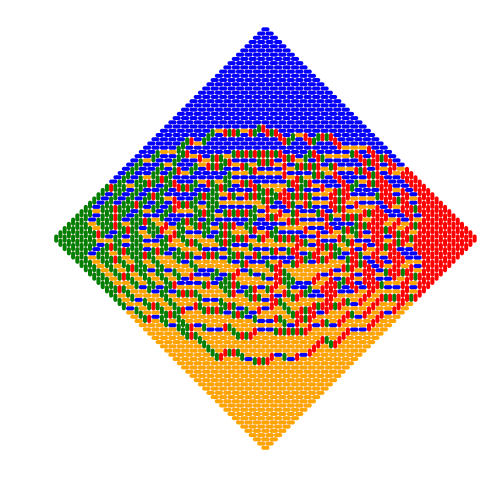

In [12]:
p = plot_generate(500)
# plot!(legend=true)
plot!(grid=false)
plot_edges(p,az_lat_full)
plot!(grid=false, axis=false)
plot_config(p, rand_config, spin_to_G, az_lat_full, A, B, sublattice)
# plot_config(p, max_flip_config, spin_to_G, az_lat_full, A, B, sublattice)
savefig(p ,"../images/aztec-random-config.pdf")

display(p)

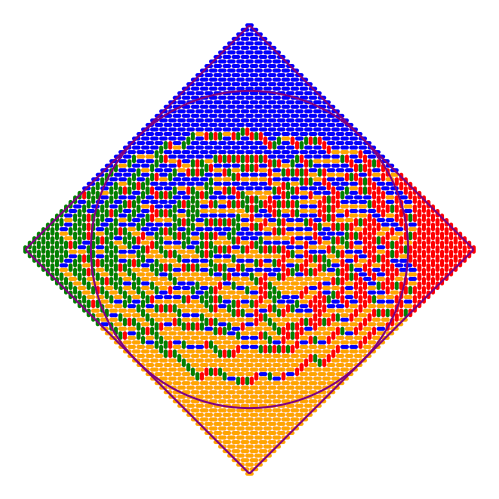

In [13]:
η = maximum(real.(az_lat_full.pts)) / 2
x_list = y_list = range(-2η, stop=2η, length=300) # -2*η:0.01:2*η

Z = [ (x/η)^2 + (y/η)^2 - 2 for x in x_list, y in y_list]

lc = :purple
contour!(p,x_list, y_list, Z, levels=[0], aspect_ratio=:equal, linecolor=lc, linewidth=2)
Z_lat = [abs(x) + abs(y) - 2η for x in x_list, y in y_list]
contour!(p,x_list, y_list, Z_lat, levels=[0], aspect_ratio=:equal, linecolor=lc, linewidth=2)
plot!(grid=false, ticks=false, framestyle=:none)
savefig(p ,"../images/aztec-random-config.pdf")
display(p)